# 3.1 Detección y descripción de características

In [1]:
!pip install -qq numpy
!pip install -qq opencv-python
!pip install -qq matplotlib
!pip install -qq git+https://github.com/udesa-vision/i308-utils.git

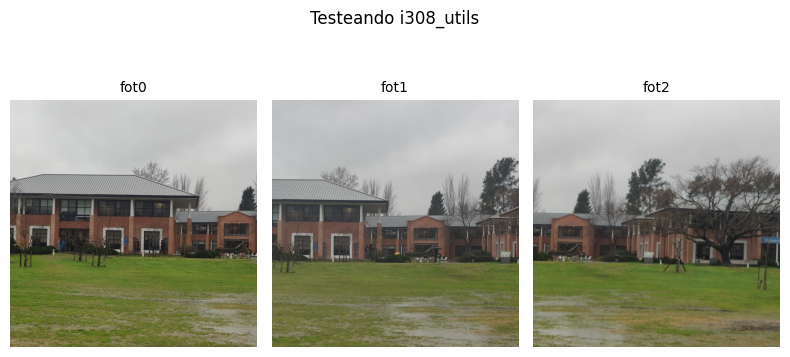

In [2]:

import cv2
import matplotlib.pyplot as plt
from i308_utils import show_images, imshow
import numpy as np


fot0= cv2.imread('img/udesa_0.jpg')
fot1= cv2.imread('img/udesa_1.jpg')
fot2= cv2.imread('img/udesa_2.jpg')

# imshow(fot0, title="fot0", figsize=(4, 4))

show_images(
    [fot0, fot1, fot2],
    ['fot0', 'fot1', 'fot2'],
    grid=(1, 3),
    title="Testeando i308_utils",
    # subtitle="hello",
    figsize=(8, 4)
)

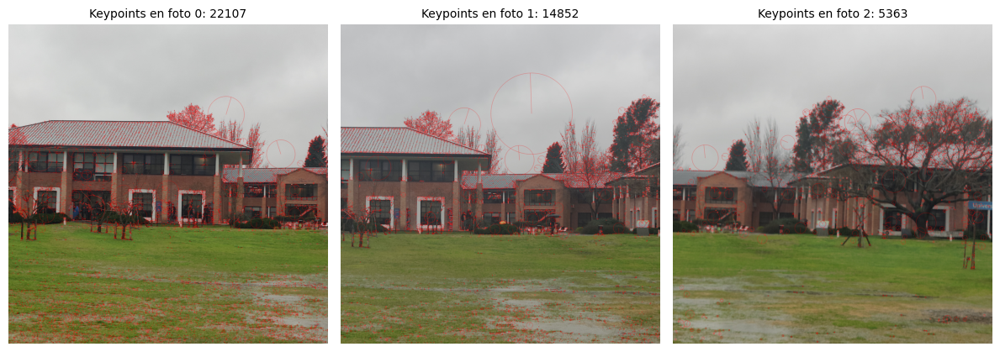

In [3]:
# Detect features in each image using SIFT
sift_algo = cv2.SIFT_create()

kp0, des0 = sift_algo.detectAndCompute(fot0, None)
kp1, des1 = sift_algo.detectAndCompute(fot1, None)
kp2, des2 = sift_algo.detectAndCompute(fot2, None)

fot0_con_kps = cv2.drawKeypoints(fot0, kp0, 0, (0, 0, 255), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
fot1_con_kps = cv2.drawKeypoints(fot1, kp1, 0, (0, 0, 255), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
fot2_con_kps = cv2.drawKeypoints(fot2, kp2, 0, (0, 0, 255), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

show_images([fot0_con_kps, fot1_con_kps, fot2_con_kps], 
            [f"Keypoints en foto 0: {len(kp0)}", f"Keypoints en foto 1: {len(kp1)}", f"Keypoints en foto 2: {len(kp2)}"], 
            grid=(1, 3), 
            figsize=(12, 6))

# 3.2 Adaptive non-maximal suppression

In [4]:

def anms(keypoints, descriptors, N=1000):

    # 1. Sort by descending response, but keep original indices
    indexed_kps = sorted(enumerate(keypoints), key=lambda x: x[1].response, reverse=True)
    
    # Prepare array for radii
    radii = [float('inf')] * len(indexed_kps)
    
    # 2. For each keypoint, compute distance to the nearest keypoint with stronger response
    for i in range(len(indexed_kps)):
        if i == 0:
            radii[i] = float('inf')
        else:
            (x_i, y_i) = indexed_kps[i][1].pt
            min_dist = float('inf')
            for j in range(i):
                (x_j, y_j) = indexed_kps[j][1].pt
                dist = (x_i - x_j)**2 + (y_i - y_j)**2
                if dist < min_dist:
                    min_dist = dist
            radii[i] = np.sqrt(min_dist)
    
    # 3. Sort by radius (descending), keep top N
    # Each element is (original_index, kp, radius)
    kps_radii = sorted(
        [(idx, kp, r) for (idx, kp), r in zip(indexed_kps, radii)], 
        key=lambda x: x[2], 
        reverse=True
    )
    selected = kps_radii[:N]
    
    # Extract final keypoints and descriptors
    selected_kps = [item[1] for item in selected]
    selected_indices = [item[0] for item in selected]
    
    selected_desc = descriptors[selected_indices, :]
    
    return selected_kps, selected_desc

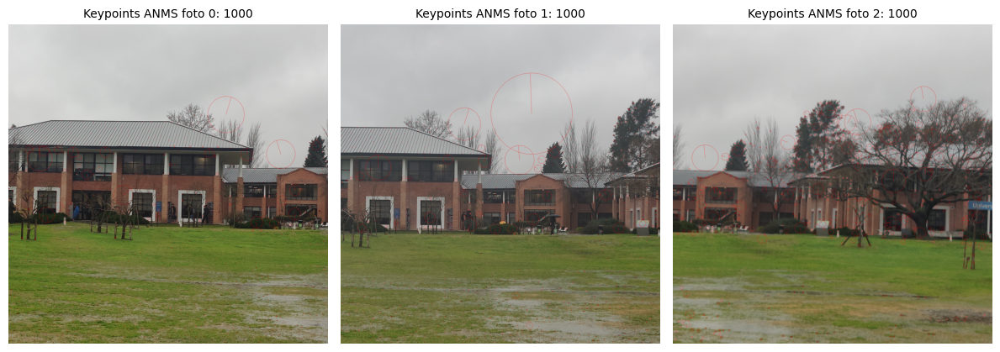

In [5]:
# Apply ANMS to each set of keypoints (choose N as desired)
N = 1000  # number of keypoints to keep
kp0_anms, des0_anms = anms(kp0, des0, N)
kp1_anms, des1_anms = anms(kp1, des1, N)
kp2_anms, des2_anms = anms(kp2, des2, N)

# Draw and visualize the filtered keypoints
fot0_anms = cv2.drawKeypoints(fot0, kp0_anms, None, (0, 0, 255), 
                              flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
fot1_anms = cv2.drawKeypoints(fot1, kp1_anms, None, (0, 0, 255), 
                              flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
fot2_anms = cv2.drawKeypoints(fot2, kp2_anms, None, (0, 0, 255), 
                              flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

show_images([fot0_anms, fot1_anms, fot2_anms],
            [f"Keypoints ANMS foto 0: {len(kp0_anms)}", 
             f"Keypoints ANMS foto 1: {len(kp1_anms)}", 
             f"Keypoints ANMS foto 2: {len(kp2_anms)}"],
            grid=(1, 3), figsize=(12, 6))

# 3.3 Asociación de características

## foto 0 y 1

Matches from image 0 to image 1: 140
Matches from image 1 to image 0: 133
Final cross-checked matches: 95


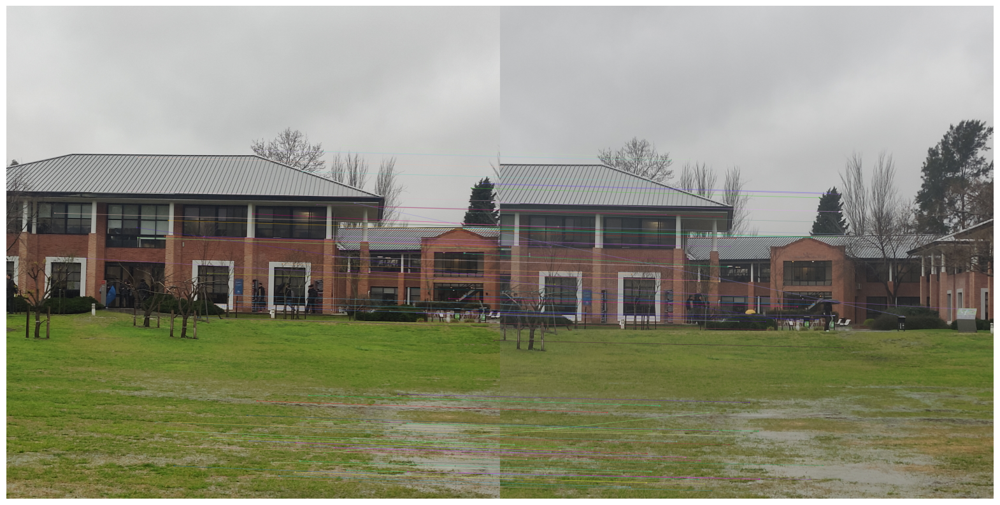

In [6]:
# Forward match: descriptors1 → descriptors2
bf = cv2.BFMatcher(cv2.NORM_L2)
matches_0to1 = bf.knnMatch(des0_anms, des1_anms, k=2)

# Apply Lowe's ratio
good_0to1 = []
for m, n in matches_0to1:
    if m.distance < 0.8 * n.distance:
        good_0to1.append(m)

# Reverse match: descriptors2 → descriptors1
matches_1to0 = bf.knnMatch(des1_anms, des0_anms, k=2)

# Lowe's ratio for reverse
good_1to0 = {}
for m, n in matches_1to0:
    if m.distance < 0.75 * n.distance:
        good_1to0[m.queryIdx] = m.trainIdx  # Map: descriptors2[i] → descriptors1[j]

# Final cross-checked matches
final_matches01 = []
for m in good_0to1:
    if good_1to0.get(m.trainIdx, -1) == m.queryIdx:
        final_matches01.append(m)
        
print(f"Matches from image 0 to image 1: {len(good_0to1)}")
print(f"Matches from image 1 to image 0: {len(good_1to0)}")
print(f"Final cross-checked matches: {len(final_matches01)}")

matched_img01 = cv2.drawMatches(
    fot0, kp0_anms,        # First image and keypoints
    fot1, kp1_anms,        # Second image and keypoints
    final_matches01,    # Matches to draw
    None,             # Output image (None = create new)
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

# Convert BGR to RGB for matplotlib
matched_img01 = cv2.cvtColor(matched_img01, cv2.COLOR_BGR2RGB)

# Display
plt.figure(figsize=(20, 12))
plt.imshow(matched_img01)
plt.axis('off')
plt.show()


## foto 1 y 2


Matches from image 0 to image 1: 220
Matches from image 1 to image 0: 53
Final cross-checked matches: 36


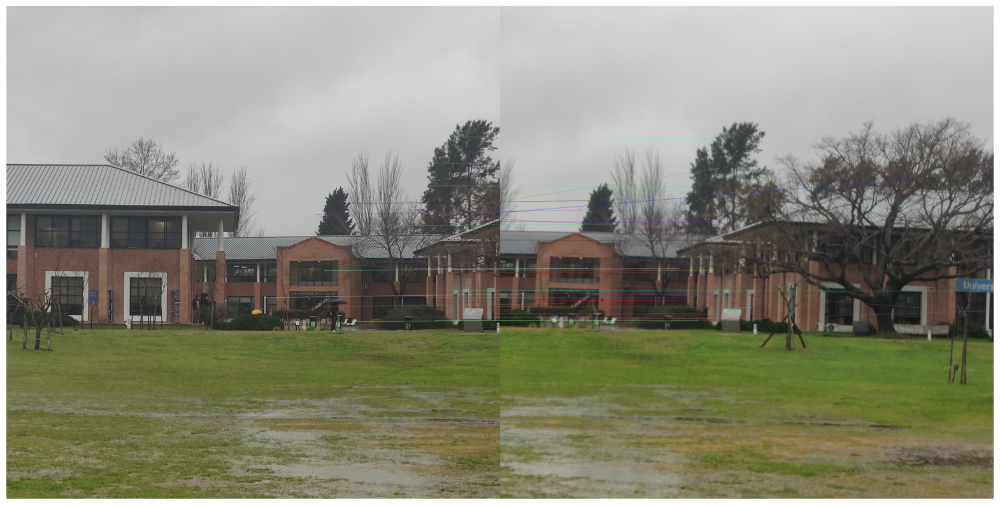

In [7]:
# Forward match: descriptors1 → descriptors2
bf2 = cv2.BFMatcher(cv2.NORM_L2)
matches_1to2 = bf.knnMatch(des1_anms, des2_anms, k=2)

# Apply Lowe's ratio
good_1to2 = []
for m, n in matches_1to2:
    if m.distance < 0.9 * n.distance:
        good_1to2.append(m)

# Reverse match: descriptors2 → descriptors1
matches_2to1 = bf.knnMatch(des2_anms, des1_anms, k=2)

# Lowe's ratio for reverse
good_2to1 = {}
for m, n in matches_2to1:
    if m.distance < 0.8 * n.distance:
        good_2to1[m.queryIdx] = m.trainIdx  # Map: descriptors2[i] → descriptors1[j]

# Final cross-checked matches
final_matches12 = []
for m in good_1to2:
    if good_2to1.get(m.trainIdx, -1) == m.queryIdx:
        final_matches12.append(m)
        
print(f"Matches from image 0 to image 1: {len(good_1to2)}")
print(f"Matches from image 1 to image 0: {len(good_2to1)}")
print(f"Final cross-checked matches: {len(final_matches12)}")

matched_img12 = cv2.drawMatches(
    fot1, kp1_anms,        # First image and keypoints
    fot2, kp2_anms,        # Second image and keypoints
    final_matches12,    # Matches to draw
    None,             # Output image (None = create new)
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

# Convert BGR to RGB for matplotlib
matched_img12 = cv2.cvtColor(matched_img12, cv2.COLOR_BGR2RGB)

# Display
plt.figure(figsize=(20, 12))
plt.imshow(matched_img12)
plt.axis('off')
plt.show()


# 3.4 Estimación manual de la homografía

In [8]:
def compute_homography(pts1, pts2):
    """
    pts1 and pts2: Nx2 arrays of corresponding (x, y) points
    """
    assert pts1.shape[0] >= 4 and pts1.shape == pts2.shape

    N = pts1.shape[0]
    A = []

    for i in range(N):
        x, y = pts1[i]
        xp, yp = pts2[i]

        A.append([-x, -y, -1,  0,  0, 0, x*xp, y*xp, xp])
        A.append([ 0,  0,  0, -x, -y, -1, x*yp, y*yp, yp])

    A = np.array(A)

    # Solve Ah = 0 using SVD
    U, S, Vt = np.linalg.svd(A)
    h = Vt[-1]  # last row of V^T corresponds to smallest singular value
    H = h.reshape(3, 3)

    # Normalize so H[2,2] = 1
    return H / H[2, 2]

## foto 0 y 1

In [9]:
# cuadro:
# matches_0_to_1 = {
#     "image0": [
#         [1609, 1942],
#         [2776, 1218],
#         [1981, 2783],
#         [2893, 2210],
#     ],
#     "image1": [
#         [147, 1896],
#         [2109, 1654],
#         [315, 2908],
#         [1796, 2919],
#     ]
# }

In [10]:
# udesa:
matches_0_to_1 = {
    "image0": [
        [1508,915],
        [1131,1549],
        [2852,1351],
        [2516,1764],
    ],
    "image1": [
        [619,972],
        [239,1616],
        [1965,1406],
        [1641,1818],
    ]
}

pts0 = np.array(matches_0_to_1["image0"])
pts1a = np.array(matches_0_to_1["image1"])

H01 = compute_homography(pts0, pts1a)
H01

array([[ 1.05890334e+00,  1.17002498e-02, -9.72251719e+02],
       [ 2.04374615e-02,  1.03550589e+00,  1.92568703e+01],
       [ 1.80964889e-05, -1.08047380e-06,  1.00000000e+00]])

## foto 1 y 2

In [11]:
# # cuadro
# matches_2_to_1 = {
#     "image2": [
#         [61,1451],
#         [26,2207],
#         [1460,1548],
#         [1319,2709],
#     ],
#     "image1": [
#         [460,1799],
#         [315,2908],
#         [2967,1691],
#         [2782,2881],
#     ]
# }


In [12]:
# udesa:
matches_2_to_1 = {
    "image1": [
        [1909,1420],
        [1581,1768],
        [2923,1911],
        [2754,1400],
    ],
    "image2": [
        [508,1400],
        [152,1741],
        [1494,1916],
        [1351,1407],
    ]
}

pts1b = np.array(matches_2_to_1["image1"])
pts2 = np.array(matches_2_to_1["image2"])

H21 = compute_homography(pts2, pts1b)
H21

array([[ 9.52549867e-01,  7.85153634e-02,  1.32693258e+03],
       [-6.04864955e-02,  1.02165733e+00,  2.91466264e+01],
       [-2.01917510e-05,  1.17229708e-05,  1.00000000e+00]])

## Stitch de panorámica con Homografías manuales

In [13]:
def compute_edge_mask(image):
    """Compute a mask based on distance to the image edge.
       Pixels at the border get 0; pixels in the center get higher values."""
    h, w = image.shape[:2]
    # Create grid of x and y coordinates
    x = np.arange(w)
    y = np.arange(h)
    xv, yv = np.meshgrid(x, y)
    # Compute distance to each of the four edges
    dist_left   = xv
    dist_right  = w - 1 - xv
    dist_top    = yv
    dist_bottom = h - 1 - yv
    # Minimum distance to any edge
    dist = np.minimum(np.minimum(dist_left, dist_right),
                      np.minimum(dist_top, dist_bottom))
    # Normalize so the maximum distance becomes 1
    normalized = dist.astype(np.float32) / np.max(dist)
    return normalized

def warp_and_blend_edge_mask_three(fot0, fot1, fot2, H_01, H_21):
    """
    Create a panorama from three images with fot1 as the anchor.
    - fot0 is warped to fot1's coordinate system using H_01.
    - fot2 is warped to fot1's coordinate system using H_21.
    - fot1 remains as the anchor image.
    """
    # Get image sizes
    h0, w0 = fot0.shape[:2]
    h1, w1 = fot1.shape[:2]
    h2, w2 = fot2.shape[:2]

    # Compute edge masks for each image.
    mask0 = compute_edge_mask(fot0)  # shape (h0, w0)
    mask1 = compute_edge_mask(fot1)  # shape (h1, w1)
    mask2 = compute_edge_mask(fot2)  # shape (h2, w2)

    # Compute corners for fot0 and warp them using H_01.
    corners0 = np.array([[0, 0], [w0, 0], [w0, h0], [0, h0]], dtype=np.float32).reshape(-1,1,2)
    warped_corners0 = cv2.perspectiveTransform(corners0, H_01).reshape(-1,2)

    # fot1 remains in its original coordinates.
    corners1 = np.array([[0, 0], [w1, 0], [w1, h1], [0, h1]], dtype=np.float32)

    # Compute corners for fot2 and warp them using H_21.
    corners2 = np.array([[0, 0], [w2, 0], [w2, h2], [0, h2]], dtype=np.float32).reshape(-1,1,2)
    warped_corners2 = cv2.perspectiveTransform(corners2, H_21).reshape(-1,2)

    # Combine all corners to determine the overall canvas.
    all_corners = np.vstack((warped_corners0, corners1, warped_corners2))
    x_min, y_min = np.floor(all_corners.min(axis=0)).astype(int)
    x_max, y_max = np.ceil(all_corners.max(axis=0)).astype(int)
    tx, ty = -x_min, -y_min  # translation offsets
    canvas_width = x_max - x_min
    canvas_height = y_max - y_min
    print("Canvas size:", canvas_width, "x", canvas_height, "Translation:", tx, ty)

    # Create translation matrix to shift everything into positive coordinates.
    T = np.array([[1, 0, tx],
                  [0, 1, ty],
                  [0, 0, 1]])

    # Warp fot0 and its mask.
    warped0 = cv2.warpPerspective(fot0, T @ H_01, (canvas_width, canvas_height))
    warped_mask0 = cv2.warpPerspective(mask0, T @ H_01, (canvas_width, canvas_height))
    
    # Warp fot2 and its mask.
    warped2 = cv2.warpPerspective(fot2, T @ H_21, (canvas_width, canvas_height))
    warped_mask2 = cv2.warpPerspective(mask2, T @ H_21, (canvas_width, canvas_height))
    
    # Place fot1 and its mask onto the canvas.
    canvas1 = np.zeros((canvas_height, canvas_width, 3), dtype=fot1.dtype)
    canvas_mask1 = np.zeros((canvas_height, canvas_width), dtype=mask1.dtype)
    canvas1[ty:ty+h1, tx:tx+w1] = fot1
    canvas_mask1[ty:ty+h1, tx:tx+w1] = mask1

    # For blending, convert masks to 3-channel.
    W0 = np.dstack([warped_mask0]*3)
    W1 = np.dstack([canvas_mask1]*3)
    W2 = np.dstack([warped_mask2]*3)

    # Blend the images using the weighted sum:
    # I = (I0*W0 + I1*W1 + I2*W2) / (W0 + W1 + W2)
    blended = (warped0.astype(np.float32) * W0 + 
               canvas1.astype(np.float32) * W1 + 
               warped2.astype(np.float32) * W2) / (W0 + W1 + W2 + 1e-6)
    blended = np.clip(blended, 0, 255).astype(np.uint8)

    return warped0, canvas1, warped2, warped_mask0, canvas_mask1, warped_mask2, blended

Canvas size: 5509 x 3299 Translation: 973 163


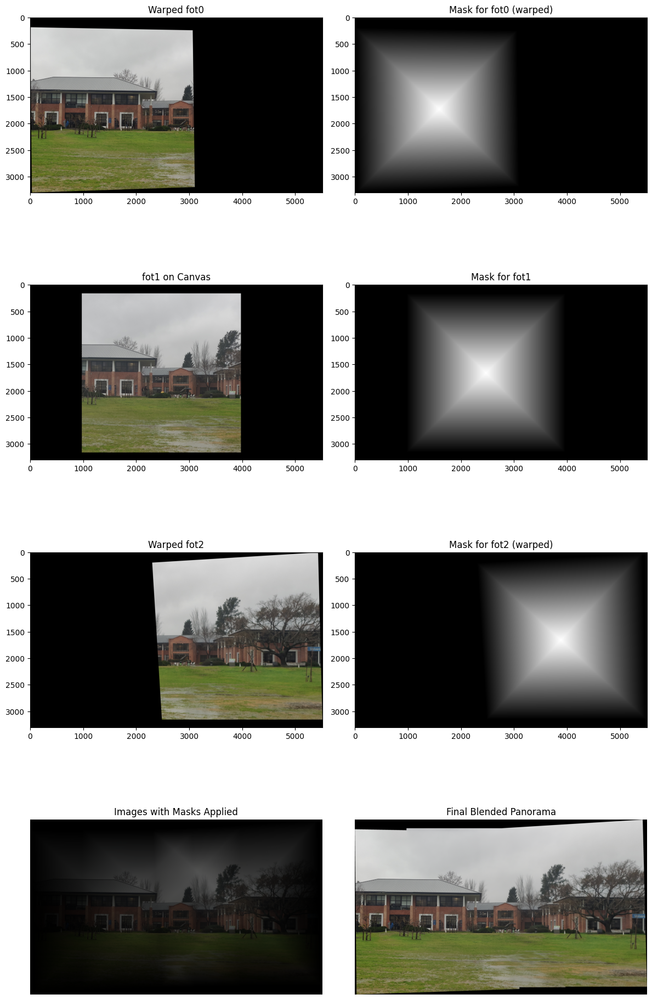

In [14]:

# Example usage:
# Assume fot0, fot1, fot2 are already defined (e.g. via cv2.imread)
# and H_ransac_01, H_ransac_21 are computed homographies.
warped0_manual, canvas1_manual, warped2_manual, mask_warped0_manual, mask_canvas1_manual, mask_warped2_manual, blended_manual = \
    warp_and_blend_edge_mask_three(fot0, fot1, fot2, H01, H21)

# Display intermediate images for debugging.
plt.figure(figsize=(12, 20))

plt.subplot(4, 2, 1)
plt.imshow(cv2.cvtColor(warped0_manual, cv2.COLOR_BGR2RGB))
plt.title("Warped fot0")

plt.subplot(4, 2, 2)
plt.imshow(mask_warped0_manual, cmap='gray')
plt.title("Mask for fot0 (warped)")

plt.subplot(4, 2, 3)
plt.imshow(cv2.cvtColor(canvas1_manual, cv2.COLOR_BGR2RGB))
plt.title("fot1 on Canvas")

plt.subplot(4, 2, 4)
plt.imshow(mask_canvas1_manual, cmap='gray')
plt.title("Mask for fot1")

plt.subplot(4, 2, 5)
plt.imshow(cv2.cvtColor(warped2_manual, cv2.COLOR_BGR2RGB))
plt.title("Warped fot2")

plt.subplot(4, 2, 6)
plt.imshow(mask_warped2_manual, cmap='gray')
plt.title("Mask for fot2 (warped)")

plt.subplot(4, 2, 7)
# Display each image multiplied by its mask.
masked0_manual = (warped0_manual.astype(np.float32) * np.dstack([mask_warped0_manual]*3)).astype(np.uint8)
masked1_manual = (canvas1_manual.astype(np.float32) * np.dstack([mask_canvas1_manual]*3)).astype(np.uint8)
masked2_manual = (warped2_manual.astype(np.float32) * np.dstack([mask_warped2_manual]*3)).astype(np.uint8)
combined_manual = cv2.addWeighted(cv2.addWeighted(masked0_manual, 0.5, masked1_manual, 0.5, 0),
                           0.5, masked2_manual, 0.5, 0)
plt.imshow(cv2.cvtColor(combined_manual, cv2.COLOR_BGR2RGB))
plt.title("Images with Masks Applied")
plt.axis("off")

plt.subplot(4, 2, 8)
plt.imshow(cv2.cvtColor(blended_manual, cv2.COLOR_BGR2RGB))
plt.title("Final Blended Panorama")
plt.axis("off")

plt.tight_layout()
plt.show()

In [15]:
# save blended_manual to img/udesa_pano_manual.jpg
cv2.imwrite('img/panorama_combined_manual.jpg', blended_manual)

True

# 3.5 RANSAC + estimación algorítmica de homografías

In [16]:
def extract_matched_points(kp1, kp2, matches):
    pts1 = np.float32([kp1[m.queryIdx].pt for m in matches])
    pts2 = np.float32([kp2[m.trainIdx].pt for m in matches])
    return pts1, pts2

def apply_homography(H, pts):
    pts_h = np.hstack([pts, np.ones((pts.shape[0], 1))])  # Nx3
    proj = (H @ pts_h.T).T  # Nx3
    proj = proj[:, :2] / proj[:, 2, np.newaxis]  # normalize
    return proj

In [17]:
def ransac_match_filter(pts1, pts2, threshold=5.0, max_iter=1000):
    best_inlier_mask = None
    max_inliers = 0
    N = pts1.shape[0]

    for _ in range(max_iter):
        idx = np.random.choice(N, 4, replace=False)
        H_candidate = compute_homography(pts1[idx], pts2[idx])
        pts1_proj = apply_homography(H_candidate, pts1)

        dists = np.linalg.norm(pts2 - pts1_proj, axis=1)
        inliers = dists < threshold
        num_inliers = np.sum(inliers)

        if num_inliers > max_inliers:
            max_inliers = num_inliers
            best_inlier_mask = inliers

    return best_inlier_mask

## foto 0 y 1

Number of inliers after RANSAC: 78


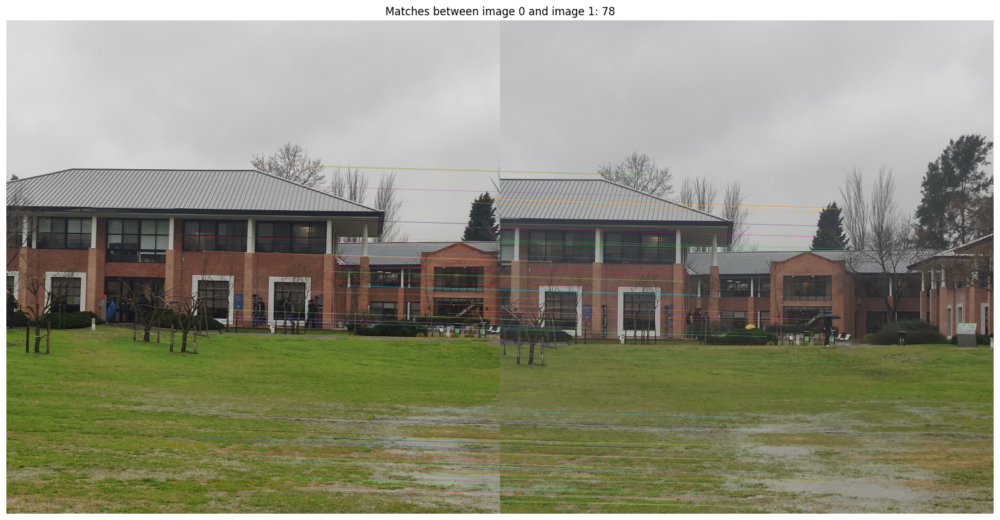

In [18]:
# kp1, kp2: keypoints from both images
# final_matches: filtered cv2.DMatch objects (after ratio + cross-check)

pts0, pts1a = extract_matched_points(kp0_anms, kp1_anms, final_matches01)

# Run RANSAC to filter inliers
inlier_mask01 = ransac_match_filter(pts0, pts1a, threshold=5.0)

# Filter the matches
inlier_matches01 = [m for i, m in enumerate(final_matches01) if inlier_mask01[i]]

print(f"Number of inliers after RANSAC: {len(inlier_matches01)}")

# plot the two images with the inliers
fot0_fot1_inliers = cv2.drawMatches(
    fot0, kp0_anms,        # First image and keypoints
    fot1, kp1_anms,        # Second image and keypoints
    inlier_matches01,    # Matches to draw
    None,             # Output image (None = create new)
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)
fot0_fot1_inliers = cv2.cvtColor(fot0_fot1_inliers, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20, 12))
plt.imshow(fot0_fot1_inliers)
plt.axis('off')
plt.title(f"Matches between image 0 and image 1: {len(inlier_matches01)}")
plt.show()

In [19]:
# Compute the final homography using inliers
H_ransac_01, mask = cv2.findHomography(pts0[inlier_mask01], pts1a[inlier_mask01], 0)

## foto 1 y 2

Number of inliers after RANSAC: 21


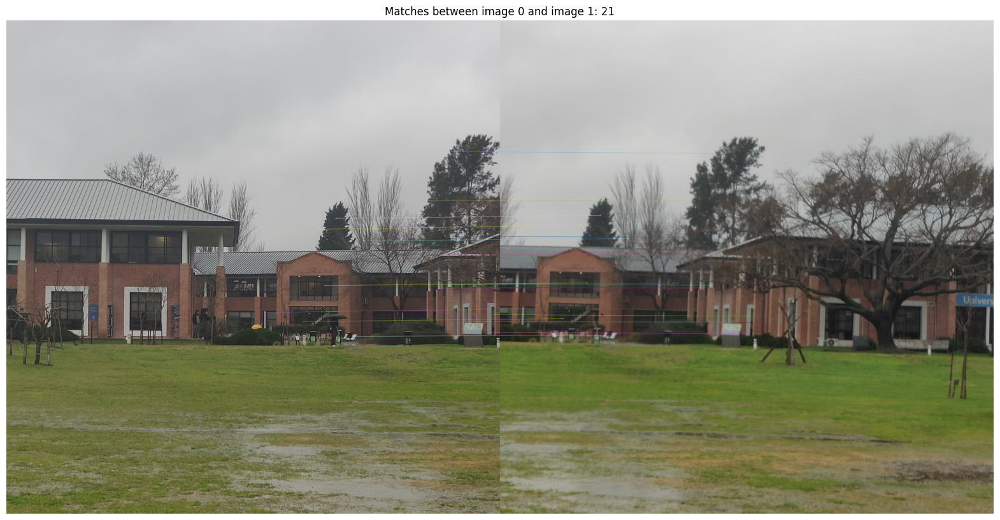

In [20]:
# kp1, kp2: keypoints from both images
# final_matches: filtered cv2.DMatch objects (after ratio + cross-check)

pts1b, pts2 = extract_matched_points(kp1_anms, kp2_anms, final_matches12)

# Run RANSAC to filter inliers
inlier_mask12 = ransac_match_filter(pts1b, pts2, threshold=5.0)

# Filter the matches
inlier_matches12 = [m for i, m in enumerate(final_matches12) if inlier_mask12[i]]

print(f"Number of inliers after RANSAC: {len(inlier_matches12)}")

# plot the two images with the inliers
fot1_fot2_inliers = cv2.drawMatches(
    fot1, kp1_anms,        # First image and keypoints
    fot2, kp2_anms,        # Second image and keypoints
    inlier_matches12,    # Matches to draw
    None,             # Output image (None = create new)
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)
fot1_fot2_inliers = cv2.cvtColor(fot1_fot2_inliers, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20, 12))
plt.imshow(fot1_fot2_inliers)
plt.axis('off')
plt.title(f"Matches between image 0 and image 1: {len(inlier_matches12)}")
plt.show()

In [21]:
# Compute the final homography using inliers
H_ransac_21, mask = cv2.findHomography(pts2[inlier_mask12], pts1b[inlier_mask12], 0)

## Stitch de panorámica con Homografías RANSAC

Canvas size: 5559 x 3297 Translation: 971 174


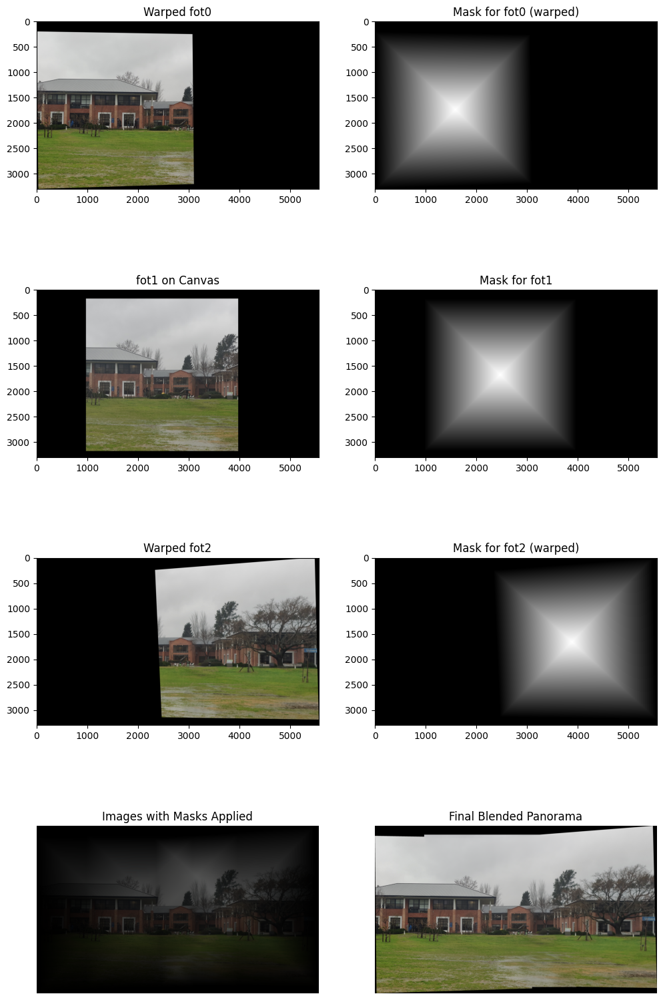

In [26]:

# Example usage:
# Assume fot0, fot1, fot2 are already defined (e.g. via cv2.imread)
# and H_ransac_01, H_ransac_21 are computed homographies.
warped0, canvas1, warped2, mask_warped0, mask_canvas1, mask_warped2, blended = \
    warp_and_blend_edge_mask_three(fot0, fot1, fot2, H_ransac_01, H_ransac_21)

# Display intermediate images for debugging.
plt.figure(figsize=(12, 20))

plt.subplot(4, 2, 1)
plt.imshow(cv2.cvtColor(warped0, cv2.COLOR_BGR2RGB))
plt.title("Warped fot0")

plt.subplot(4, 2, 2)
plt.imshow(mask_warped0, cmap='gray')
plt.title("Mask for fot0 (warped)")

plt.subplot(4, 2, 3)
plt.imshow(cv2.cvtColor(canvas1, cv2.COLOR_BGR2RGB))
plt.title("fot1 on Canvas")

plt.subplot(4, 2, 4)
plt.imshow(mask_canvas1, cmap='gray')
plt.title("Mask for fot1")

plt.subplot(4, 2, 5)
plt.imshow(cv2.cvtColor(warped2, cv2.COLOR_BGR2RGB))
plt.title("Warped fot2")

plt.subplot(4, 2, 6)
plt.imshow(mask_warped2, cmap='gray')
plt.title("Mask for fot2 (warped)")

plt.subplot(4, 2, 7)
# Display each image multiplied by its mask.
masked0 = (warped0.astype(np.float32) * np.dstack([mask_warped0]*3)).astype(np.uint8)
masked1 = (canvas1.astype(np.float32) * np.dstack([mask_canvas1]*3)).astype(np.uint8)
masked2 = (warped2.astype(np.float32) * np.dstack([mask_warped2]*3)).astype(np.uint8)
combined = cv2.addWeighted(cv2.addWeighted(masked0, 0.5, masked1, 0.5, 0),
                           0.5, masked2, 0.5, 0)
plt.imshow(cv2.cvtColor(combined, cv2.COLOR_BGR2RGB))
plt.title("Images with Masks Applied")
plt.axis("off")

plt.subplot(4, 2, 8)
plt.imshow(cv2.cvtColor(blended, cv2.COLOR_BGR2RGB))
plt.title("Final Blended Panorama")
plt.axis("off")
plt.show()

In [27]:
# export combined panorama
cv2.imwrite("img/panorama_combined_ransac.jpg", blended)

True